In [1]:
url_base = '.'
urls = url_base + '/norm_final_sk_hynix.csv'

In [2]:
import pandas as pd
import utils
import data_preprocessing as dp

stock_info = utils.load_data(urls)
stock_info = dp.addChangeRateColumn(stock_info, "코스피", "코스피_등락률")

stock_info["코스피_등락률"] = stock_info["코스피_등락률"]*100

stock_info = dp.addQuantyColumns(stock_info, [5, 10, 30, 60, 120], '회전율', 'Close')

stock_info = stock_info.apply(lambda x: pd.to_numeric(x, errors='coerce')).fillna(method='bfill')

stock_info = stock_info.iloc[120:]
stock_info = stock_info.drop(["코스피"] ,axis=1)

stock_info

,Close,등락률,PER,PBR,회전율,환율,나스닥,코스피_등락률,전일대비거래량비율,5일평균거래량대비거래량비율,5일평균종가대비종가비율,10일평균거래량대비거래량비율,10일평균종가대비종가비율,30일평균거래량대비거래량비율,30일평균종가대비종가비율,60일평균거래량대비거래량비율,60일평균종가대비종가비율,120일평균거래량대비거래량비율,120일평균종가대비종가비율
120,51600,2.38,12.76,2.80,0.0031,1008.799988,-0.77,-0.290904,0.815789,0.741627,1.032413,0.678337,1.042108,0.662865,1.097211,0.708032,1.191388,0.634163,1.271001
121,51900,0.58,12.83,2.82,0.0031,1010.599976,-1.35,0.076803,1.000000,0.786802,1.024679,0.702948,1.041855,0.661922,1.095823,0.708302,1.191278,0.636659,1.274310
122,49750,-4.14,12.30,2.70,0.0069,1010.799988,0.63,-0.306978,2.225806,1.506550,0.977215,1.496746,0.999799,1.436502,1.045022,1.561086,1.136493,1.419023,1.218504
123,49300,-0.90,12.19,2.68,0.0037,1011.000000,-0.52,0.116971,0.536232,0.898058,0.972578,0.795699,0.991752,0.766046,1.030554,0.837104,1.120964,0.762232,1.204655
124,48950,-0.71,12.10,2.66,0.0034,1012.200012,0.44,-0.704000,0.918919,0.841584,0.973161,0.776256,0.984315,0.695771,1.018448,0.768651,1.107884,0.707474,1.193684
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2271,117800,0.51,36.34,1.28,0.0032,1265.449951,0.76,-0.434517,0.969697,0.717489,1.011159,0.769231,1.025686,0.662983,1.027266,0.645161,1.134219,0.673448,1.225095
2272,117500,-0.25,36.24,1.28,0.0035,1264.939941,0.03,0.023776,1.093750,0.770925,1.004961,0.839329,1.022361,0.735294,1.022510,0.703047,1.125928,0.734908,1.218648
2273,116900,-0.51,36.06,1.27,0.0027,1265.089966,-2.05,-0.307104,0.771429,0.652174,0.995063,0.681818,1.014405,0.574876,1.014874,0.542532,1.115068,0.566335,1.209102
2274,115100,-1.54,35.50,1.25,0.0038,1278.400024,-0.22,0.366506,1.407407,1.151515,0.984602,0.959596,0.995933,0.813704,0.997199,0.760000,1.093137,0.794979,1.187455


In [3]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

scaling_target = ['PER', 'PBR', '환율']
stock_info[scaling_target] = scaler.fit_transform(stock_info[scaling_target])
stock_info

,Close,등락률,PER,PBR,회전율,환율,나스닥,코스피_등락률,전일대비거래량비율,5일평균거래량대비거래량비율,5일평균종가대비종가비율,10일평균거래량대비거래량비율,10일평균종가대비종가비율,30일평균거래량대비거래량비율,30일평균종가대비종가비율,60일평균거래량대비거래량비율,60일평균종가대비종가비율,120일평균거래량대비거래량비율,120일평균종가대비종가비율
120,51600,2.38,0.208316,0.989950,0.0031,0.000000,-0.77,-0.290904,0.815789,0.741627,1.032413,0.678337,1.042108,0.662865,1.097211,0.708032,1.191388,0.634163,1.271001
121,51900,0.58,0.209786,1.000000,0.0031,0.004136,-1.35,0.076803,1.000000,0.786802,1.024679,0.702948,1.041855,0.661922,1.095823,0.708302,1.191278,0.636659,1.274310
122,49750,-4.14,0.198656,0.939698,0.0069,0.004596,0.63,-0.306978,2.225806,1.506550,0.977215,1.496746,0.999799,1.436502,1.045022,1.561086,1.136493,1.419023,1.218504
123,49300,-0.90,0.196346,0.929648,0.0037,0.005056,-0.52,0.116971,0.536232,0.898058,0.972578,0.795699,0.991752,0.766046,1.030554,0.837104,1.120964,0.762232,1.204655
124,48950,-0.71,0.194456,0.919598,0.0034,0.007813,0.44,-0.704000,0.918919,0.841584,0.973161,0.776256,0.984315,0.695771,1.018448,0.768651,1.107884,0.707474,1.193684
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2271,117800,0.51,0.703486,0.226131,0.0032,0.589783,0.76,-0.434517,0.969697,0.717489,1.011159,0.769231,1.025686,0.662983,1.027266,0.645161,1.134219,0.673448,1.225095
2272,117500,-0.25,0.701386,0.226131,0.0035,0.588611,0.03,0.023776,1.093750,0.770925,1.004961,0.839329,1.022361,0.735294,1.022510,0.703047,1.125928,0.734908,1.218648
2273,116900,-0.51,0.697606,0.221106,0.0027,0.588956,-2.05,-0.307104,0.771429,0.652174,0.995063,0.681818,1.014405,0.574876,1.014874,0.542532,1.115068,0.566335,1.209102
2274,115100,-1.54,0.685846,0.211055,0.0038,0.619542,-0.22,0.366506,1.407407,1.151515,0.984602,0.959596,0.995933,0.813704,0.997199,0.760000,1.093137,0.794979,1.187455


In [4]:
index_slicer = int(len(stock_info) * 0.8)
stock_info_train = stock_info.iloc[:index_slicer]
stock_info_test = stock_info.iloc[index_slicer:]

In [5]:
import stocks_env as env
from stable_baselines3 import A2C

hp_env = env.StocksEnv(stock_info_train, window_size=10, frame_bound=(10, len(stock_info_train)))

In [6]:

model = A2C('MlpPolicy', hp_env, verbose=1, learning_rate=0.0003, tensorboard_log="./logs/final_DQN2/")
# model = DQN('MultiInputPolicy', env, verbose=1, learning_rate=0.0001, buffer_size=10000, batch_size=64, exploration_fraction=0.2, exploration_final_eps=0.03, tensorboard_log="./logs/final_DQN/")

model.learn(total_timesteps=100000, log_interval=1, progress_bar=True)

Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Logging to ./logs/final_DQN2/A2C_4


Output()

---------------------------
| time/              |    |
|    fps             | 57 |
|    iterations      | 1  |
|    time_elapsed    | 0  |
|    total_timesteps | 5  |
---------------------------
-------------------------------------
| time/                 |           |
|    fps                | 88        |
|    iterations         | 2         |
|    time_elapsed       | 0         |
|    total_timesteps    | 10        |
| train/                |           |
|    entropy_loss       | -0.693    |
|    explained_variance | 5.13e-05  |
|    learning_rate      | 0.0003    |
|    n_updates          | 1         |
|    policy_loss        | -1.42e+03 |
|    value_loss         | 7e+06     |
-------------------------------------
-------------------------------------
| time/                 |           |
|    fps                | 126       |
|    iterations         | 3         |
|    time_elapsed       | 0         |
|    total_timesteps    | 15        |
| train/                |           |
|    e

In [7]:
model.save("./models/A2C_0.0003_100000_anytrading.zip")

In [8]:
env_test = env.StocksEnv(stock_info_test, window_size=10, frame_bound=(10, len(stock_info_test)))
env_test.reset()

(array([[100000.,  -3000.],
        [ 97900.,  -2100.],
        [ 96500.,  -1400.],
        [ 95700.,   -800.],
        [ 94000.,  -1700.],
        [ 91500.,  -2500.],
        [ 92000.,    500.],
        [ 93800.,   1800.],
        [ 98400.,   4600.],
        [ 97100.,  -1300.]], dtype=float32),
 {'total_reward': 0.0, 'total_profit': 1.0, 'position': <Positions.Short: 0>})

In [9]:
while True:
    action = env_test.action_space.sample()
    observation, reward, terminated, truncated, info = env_test.step(action)
    done = terminated or truncated

    # env.render()
    if done:
        print("info:", info)
        break

info: {'total_reward': -5300.0, 'total_profit': 0.20480735914580164, 'position': <Positions.Short: 0>}


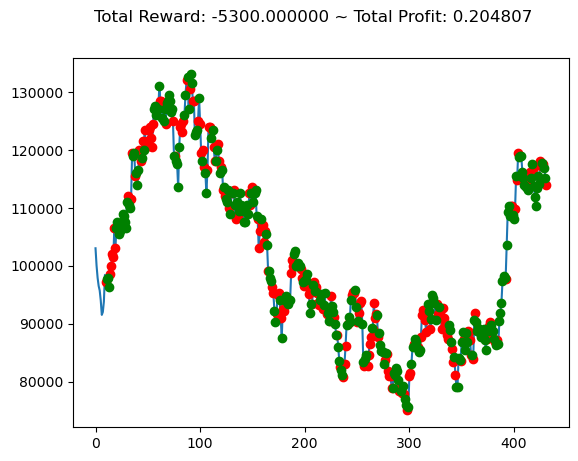

In [11]:
import matplotlib.pyplot as plt

plt.cla()
env_test.unwrapped.render_all()
plt.show()

In [ ]:
import numpy as np
window_size = env.window_size
plt.figure() # 초기화 역할

closes = stock_info_test['Close'] / stock_info_test['Close'].iloc[0]  # close feature를 초기 close 값으로 나눔
x = np.arange(window_size, ITER_LIMIT)

print(np.shape(closes))
print(np.shape(x))
print(np.shape(profits))

In [ ]:
plt.plot(closes, label='closes')
plt.plot(profits, label='profits')

In [ ]:
plt.plot(x, closes[window_size:], label='closes')
plt.plot(x, profits[window_size:], label='profits')
plt.xlabel('Episode')
plt.ylabel('Reward')
plt.title('Reward Graph')
plt.legend()
plt.show()


In [ ]:
plt.figure() # 초기화 역할
plt.plot(actions, label='actions')
plt.xlabel('Episode')
plt.ylabel('Action')
plt.title('Action Graph')
plt.legend()
plt.show()